<a href="https://colab.research.google.com/github/ksemiu/Classification-and-Trends-BEVs-and-PHEVs-in-Washington-s-Vehicle-Registry/blob/main/EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
pip install ydata-profiling


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.9/357.9 kB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 13.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 12.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.3/293.3 kB 40.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 26.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 42.7 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=c276baa972c009b3a7128ce8a46225230fb4f8e217627ba0e2d0e9adc5b4050b
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: seaborn
    Found existing installation: seaborn 0.13.1
    Uninstalling seaborn-0.13.1:
      Successfully uninstalled seaborn-0.13.1


In [2]:
import numpy as np
import pandas as pd
from ydata_profiling import ProfileReport

import matplotlib.pyplot as plt
import missingno as msno

In [3]:
#dataset

df = pd.read_csv('/content/Electric_Vehicle_Population_Data copy.csv')


In [ ]:
print(df.describe())


         Postal Code     Model Year  Electric Range      Base MSRP  \
count  166795.000000  166800.000000   166800.000000  166800.000000   
mean    98173.713750    2020.341793       61.508993    1152.723171   
std      2442.584415       3.001465       93.271747    8661.081091   
min      1730.000000    1997.000000        0.000000       0.000000   
25%     98052.000000    2018.000000        0.000000       0.000000   
50%     98122.000000    2021.000000        0.000000       0.000000   
75%     98371.000000    2023.000000       84.000000       0.000000   
max     99577.000000    2024.000000      337.000000  845000.000000   

       Legislative District  DOL Vehicle ID  2020 Census Tract  
count         166440.000000    1.668000e+05       1.667950e+05  
mean              29.178941    2.172420e+08       5.297709e+10  
std               14.853534    7.727458e+07       1.569754e+09  
min                1.000000    4.385000e+03       1.001020e+09  
25%               18.000000    1.790741e+08 

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 166800 entries, 0 to 166799
Data columns (total 17 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   VIN (1-10)                                         166800 non-null  object 
 1   County                                             166795 non-null  object 
 2   City                                               166795 non-null  object 
 3   State                                              166800 non-null  object 
 4   Postal Code                                        166795 non-null  float64
 5   Model Year                                         166800 non-null  int64  
 6   Make                                               166800 non-null  object 
 7   Model                                              166800 non-null  object 
 8   Electric Vehicle Type                              166800 non-null  object

In [ ]:
df.shape

(166800, 17)

In [ ]:
#initialize categorical and numerical data
category = [i for i in df.columns if df[i].dtype == 'object']
numerical = [i for i in df.columns if df[i].dtype != 'object']

In [ ]:
#statistical summary of numerical data
df[numerical].describe().T

,count,mean,std,min,25%,50%,75%,max
Postal Code,166795.0,9.817371e+04,2.442584e+03,1.730000e+03,9.805200e+04,9.812200e+04,9.837100e+04,9.957700e+04
Model Year,166800.0,2.020342e+03,3.001465e+00,1.997000e+03,2.018000e+03,2.021000e+03,2.023000e+03,2.024000e+03
Electric Range,166800.0,6.150899e+01,9.327175e+01,0.000000e+00,0.000000e+00,0.000000e+00,8.400000e+01,3.370000e+02
Base MSRP,166800.0,1.152723e+03,8.661081e+03,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,8.450000e+05
Legislative District,166440.0,2.917894e+01,1.485353e+01,1.000000e+00,1.800000e+01,3.300000e+01,4.200000e+01,4.900000e+01
DOL Vehicle ID,166800.0,2.172420e+08,7.727458e+07,4.385000e+03,1.790741e+08,2.244045e+08,2.513421e+08,4.792548e+08
2020 Census Tract,166795.0,5.297709e+10,1.569754e+09,1.001020e+09,5.303301e+10,5.303303e+10,5.305307e+10,5.603300e+10


In [ ]:
#statistical summary of categorical data
df[category].describe().T

,count,unique,top,freq
VIN (1-10),166800,10316,7SAYGDEE6P,1114
County,166795,187,King,86594
City,166795,704,Seattle,27831
State,166800,44,WA,166440
Make,166800,39,TESLA,74834
Model,166800,138,MODEL Y,32822
Electric Vehicle Type,166800,2,Battery Electric Vehicle (BEV),130293
Clean Alternative Fuel Vehicle (CAFV) Eligibility,166800,3,Eligibility unknown as battery range has not b...,83517
Vehicle Location,166790,835,POINT (-122.12302 47.67668),4252
Electric Utility,166795,76,PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),61337


In [ ]:
#Identifying duplicates

df.duplicated().sum()


0

In [ ]:
#Identifying misssing values

df.isnull().sum()

VIN (1-10)                                             0
County                                                 5
City                                                   5
State                                                  0
Postal Code                                            5
Model Year                                             0
Make                                                   0
Model                                                  0
Electric Vehicle Type                                  0
Clean Alternative Fuel Vehicle (CAFV) Eligibility      0
Electric Range                                         0
Base MSRP                                              0
Legislative District                                 360
DOL Vehicle ID                                         0
Vehicle Location                                      10
Electric Utility                                       5
2020 Census Tract                                      5
dtype: int64

In [ ]:
#attributes with missing values
df.columns[df.isnull().any()]


Index(['County', 'City', 'Postal Code', 'Legislative District',
       'Vehicle Location', 'Electric Utility', '2020 Census Tract'],
      dtype='object')

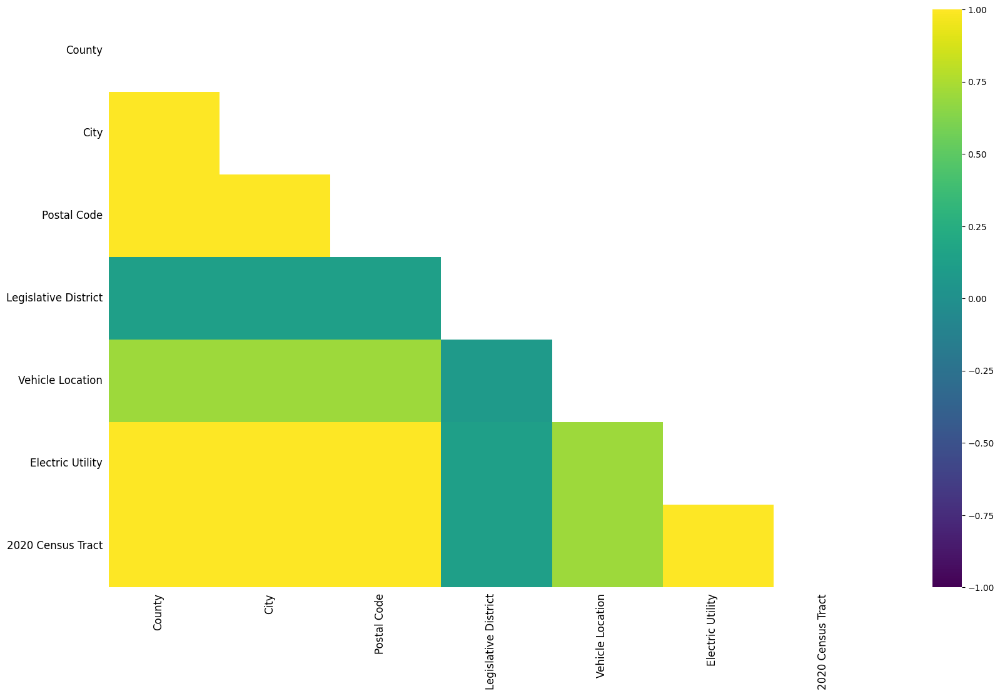

In [ ]:
#visually identifying attributes with missing values
missing_values = df.columns[df.isnull().any()]

#plotting heatmap of missing values with a different color
g = msno.heatmap(df[missing_values], fontsize=12, labels=False, cmap='viridis')
g.set_xticklabels(g.get_xticklabels(), rotation=90, horizontalalignment='right')

plt.show()

The heatmap reveals correlations among certain features in terms of missing values, such as associations between City and County, Postal Code and City, Postal Code and County, among others. Consequently, the presence of a missing value in one column implies a corresponding missing value in another column within these identified correlations.

In [ ]:
#handling the missing values with complete case analysis

#droping the missing values of City and County
df.dropna(subset=['County', 'City'], inplace=True)

#show missing values of data
df.isnull().sum()

VIN (1-10)                                             0
County                                                 0
City                                                   0
State                                                  0
Postal Code                                            0
Model Year                                             0
Make                                                   0
Model                                                  0
Electric Vehicle Type                                  0
Clean Alternative Fuel Vehicle (CAFV) Eligibility      0
Electric Range                                         0
Base MSRP                                              0
Legislative District                                 355
DOL Vehicle ID                                         0
Vehicle Location                                       5
Electric Utility                                       0
2020 Census Tract                                      0
dtype: int64

In [ ]:
#inpute missing values for the other attributes; Legislative District and Vehicle Location

def impute_numeric_data(data, columns, strategy='median'):
    for col in columns:
        if strategy == 'median':
            median_value = data[col].median()
            data[col].fillna(median_value, inplace=True)
        elif strategy == 'mean':
            mean_value = data[col].mean()
            data[col].fillna(mean_value, inplace=True)
        # Add more conditions for other strategies if needed

def impute_categoric_data(data, columns):
    for col in columns:
        mode_value = data[col].mode().iloc[0]
        data[col].fillna(mode_value, inplace=True)


impute_numeric_data(df, ['Legislative District'], strategy='median')
impute_categoric_data(df, ['Model', 'Vehicle Location'])

#Show missing values after imputation
print(df.isnull().sum())


VIN (1-10)                                           0
County                                               0
City                                                 0
State                                                0
Postal Code                                          0
Model Year                                           0
Make                                                 0
Model                                                0
Electric Vehicle Type                                0
Clean Alternative Fuel Vehicle (CAFV) Eligibility    0
Electric Range                                       0
Base MSRP                                            0
Legislative District                                 0
DOL Vehicle ID                                       0
Vehicle Location                                     0
Electric Utility                                     0
2020 Census Tract                                    0
dtype: int64


In [ ]:
#Standardizing and Simplifying the attributes
#Dictionary for replacements for attribute Electric Vehicle Type for simplication
replacement_dict = {
    'Plug-in Hybrid Electric Vehicle (PHEV)': 'PHEV',
    'Battery Electric Vehicle (BEV)': 'BEV'
}

#Apply the replacements using the map function
df['Electric Vehicle Type'] = df['Electric Vehicle Type'].map(replacement_dict)

#Renaming CAFV
df.rename(columns={'Clean Alternative Fuel Vehicle (CAFV) Eligibility': 'Clean Alternative Fuel Vehicle Eligibility'}, inplace=True)





In [ ]:
#Vehicle Location - extracting longitude and latitude
def extract_coordinates(point_string):
    coordinates = pd.Series(point_string).str.extract(r'POINT \(([-\d.]+) ([-\d.]+)\)', expand=False)
    return pd.to_numeric(coordinates[0]), pd.to_numeric(coordinates[1])

# Apply the 'extract_coordinates' function to 'Vehicle Location' column
df[['Longitude', 'Latitude']] = df['Vehicle Location'].apply(extract_coordinates).apply(pd.Series)

# Drop the original 'Vehicle Location' column
df = df.drop('Vehicle Location', axis=1)



In [ ]:
state_mapping = {
    'AL': 'Alabama', 'AK': 'Alaska', 'AZ': 'Arizona', 'AR': 'Arkansas',
    'CA': 'California', 'CO': 'Colorado', 'CT': 'Connecticut', 'DE': 'Delaware',
    'FL': 'Florida', 'GA': 'Georgia', 'HI': 'Hawaii', 'ID': 'Idaho',
    'IL': 'Illinois', 'IN': 'Indiana', 'IA': 'Iowa', 'KS': 'Kansas',
    'KY': 'Kentucky', 'LA': 'Louisiana', 'ME': 'Maine', 'MD': 'Maryland',
    'MA': 'Massachusetts', 'MI': 'Michigan', 'MN': 'Minnesota', 'MS': 'Mississippi',
    'MO': 'Missouri', 'MT': 'Montana', 'NE': 'Nebraska', 'NV': 'Nevada',
    'NH': 'New Hampshire', 'NJ': 'New Jersey', 'NM': 'New Mexico', 'NY': 'New York',
    'NC': 'North Carolina', 'ND': 'North Dakota', 'OH': 'Ohio', 'OK': 'Oklahoma',
    'OR': 'Oregon', 'PA': 'Pennsylvania', 'RI': 'Rhode Island', 'SC': 'South Carolina',
    'SD': 'South Dakota', 'TN': 'Tennessee', 'TX': 'Texas', 'UT': 'Utah',
    'VT': 'Vermont', 'VA': 'Virginia', 'WA': 'Washington', 'WV': 'West Virginia',
    'WI': 'Wisconsin', 'WY': 'Wyoming'
}

# Apply the state mapping using the replace method
df['State'] = df['State'].replace(state_mapping)

# Function to extract the first substring from a column
def extract_substring(data, column_name):
    data[column_name] = data[column_name].str.split('-|\\|').str[0].str.strip()

# Apply the 'extract_substring' function to 'Electric Utility' column
extract_substring(df, 'Electric Utility')

In [ ]:
df.head()


,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Electric Utility,2020 Census Tract,Longitude,Latitude
0,3C3CFFGE4E,Yakima,Yakima,Washington,98902.0,2014,FIAT,500,BEV,Clean Alternative Fuel Vehicle Eligible,87,0,14.0,1593721,PACIFICORP,5.307700e+10,"0 -120.524012 Name: 0, dtype: float64","0 46.597394 Name: 1, dtype: float64"
1,5YJXCBE40H,Thurston,Olympia,Washington,98513.0,2017,TESLA,MODEL X,BEV,Clean Alternative Fuel Vehicle Eligible,200,0,2.0,257167501,PUGET SOUND ENERGY INC,5.306701e+10,"0 -122.817545 Name: 0, dtype: float64","0 46.98876 Name: 1, dtype: float64"
2,3MW39FS03P,King,Renton,Washington,98058.0,2023,BMW,330E,PHEV,Not eligible due to low battery range,20,0,11.0,224071816,PUGET SOUND ENERGY INC,5.303303e+10,"0 -122.129888 Name: 0, dtype: float64","0 47.445126 Name: 1, dtype: float64"
3,7PDSGABA8P,Snohomish,Bothell,Washington,98012.0,2023,RIVIAN,R1S,BEV,Eligibility unknown as battery range has not b...,0,0,21.0,260084653,PUGET SOUND ENERGY INC,5.306105e+10,"0 -122.1873 Name: 0, dtype: float64","0 47.820245 Name: 1, dtype: float64"
4,5YJ3E1EB8L,King,Kent,Washington,98031.0,2020,TESLA,MODEL 3,BEV,Clean Alternative Fuel Vehicle Eligible,322,0,33.0,253771913,PUGET SOUND ENERGY INC,5.303303e+10,"0 -122.201252 Name: 0, dtype: float64","0 47.393181 Name: 1, dtype: float64"


In [ ]:
#Encoding the categorical values

categorical_columns = df.select_dtypes(include='object').columns

#Iterate over each categorical column and print value counts
for col in categorical_columns:
    print(df[col].value_counts())
    print()

7SAYGDEE6P    1114
7SAYGDEE7P    1090
7SAYGDEEXP    1071
7SAYGDEE8P    1071
7SAYGDEE0P    1052
              ... 
WAU8HAF88L       1
1GYKPMRL8R       1
YV4BR0CM2M       1
YV4ED3GKXP       1
YV4ED3GK6P       1
Name: VIN (1-10), Length: 10315, dtype: int64

King          86594
Snohomish     19570
Pierce        12972
Clark          9847
Thurston       6042
              ...  
Sacramento        1
Suffolk           1
Las Animas        1
Pitt              1
Ada               1
Name: County, Length: 187, dtype: int64

Seattle      27831
Bellevue      8364
Redmond       6032
Vancouver     5869
Bothell       5440
             ...  
Bell Hill        1
Sheridan         1
Kenn             1
Miami            1
Stratford        1
Name: City, Length: 704, dtype: int64

Washington        166440
California            91
Virginia              38
Maryland              32
Texas                 24
North Carolina        14
Illinois              13
Colorado              12
Florida               10
Hawaii    

In [ ]:
pip install category_encoders


In [ ]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder
import category_encoders as ce

In [ ]:
#encoding categorical values into numeric

def encode_data(data, columns, method):
  #method i: one-hot encoding
    if method == 'ohe':
        encoded_columns = pd.get_dummies(data[columns], prefix=columns)
        data = pd.concat([data, encoded_columns], axis=1)
        data.drop(columns, axis=1, inplace=True)
    #ordinal encoding
    elif method == 'ordinal':
        ordinal_enc = OrdinalEncoder()
        encoded_columns = ordinal_enc.fit_transform(data[columns])
        data[columns] = encoded_columns
        data[columns] = encoded_columns.astype(int)

    # frequency encoding
    elif method == 'frequency':
        encoder = ce.CountEncoder(cols=columns)
        data = encoder.fit_transform(data)

    return data

In [ ]:
ordinal_columns = ['State', 'Make', 'Electric Vehicle Type', 'Clean Alternative Fuel Vehicle Eligibility']
frequency_columns = ['VIN (1-10)', 'County', 'City', 'Model', 'Electric Utility']

train = df.copy()

#applying the 'encode_data' function to 'ordinal_columns' and 'frequency_columns'
train = encode_data(train, ordinal_columns, method='ordinal')
train = encode_data(train, frequency_columns, method='frequency')

train

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,8,943,639,42,98902.0,2014,9,801,0,0,87,0,14.0,1593721,POINT (-120.524012 46.5973939),1245,5.307700e+10
1,4,6042,4058,42,98513.0,2017,33,5429,0,0,200,0,2.0,257167501,POINT (-122.817545 46.98876),33669,5.306701e+10
2,5,86594,4617,42,98058.0,2023,4,431,1,2,20,0,11.0,224071816,POINT (-122.1298876 47.4451257),61337,5.303303e+10
3,98,19570,5440,42,98012.0,2023,30,1622,0,1,0,0,21.0,260084653,POINT (-122.1873 47.820245),33669,5.306105e+10
4,170,86594,2602,42,98031.0,2020,33,28926,0,0,322,0,33.0,253771913,POINT (-122.2012521 47.3931814),61337,5.303303e+10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
166795,13,4312,2573,42,99223.0,2013,11,1778,1,2,19,0,6.0,239527123,POINT (-117.369705 47.62637),2621,5.306300e+10
166796,410,86594,4876,42,98074.0,2021,33,32822,0,1,0,0,45.0,148715479,POINT (-122.0313266 47.6285782),61337,5.303303e+10
166797,375,19570,737,42,98275.0,2022,33,32822,0,1,0,0,21.0,220504406,POINT (-122.299965 47.94171),33669,5.306104e+10
166798,10,709,28,42,98564.0,2013,6,4825,1,0,38,0,20.0,156418475,POINT (-122.487535 46.5290135),324,5.304197e+10


In [ ]:
#EDA using ydata-profling and sweetviz

In [ ]:
pip install --upgrade Pillow

In [ ]:
profile = ProfileReport(train, title="Profiling Report")


In [ ]:
profile.to_file("pandas_profiling_report.html")


/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:354: UserWarning: Try running command: 'pip install --upgrade Pillow' to avoid ValueError
  warnings.warn(


Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile

In [ ]:
#Using sweetviz:
!pip install sweetviz


In [ ]:
import sweetviz as sv

#Create a DataframeReport
report = sv.analyze(train)

# Save the report to an HTML file
report.show_html("sweetviz_report.html")


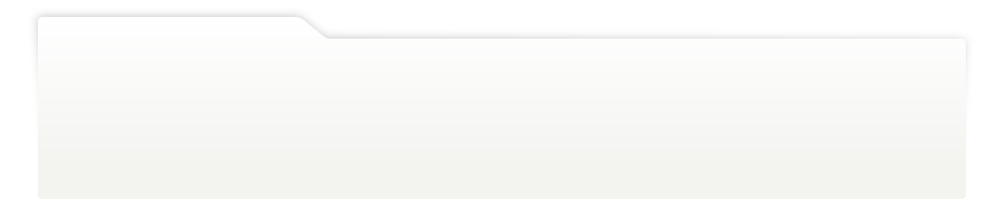
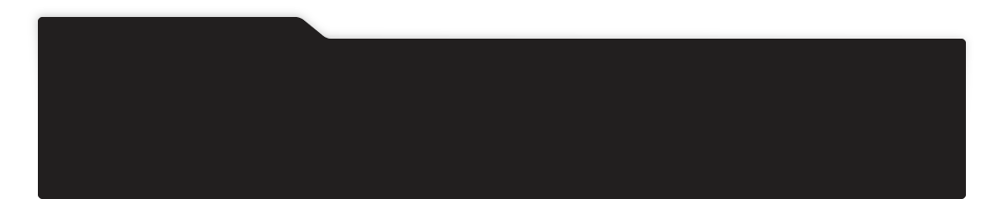
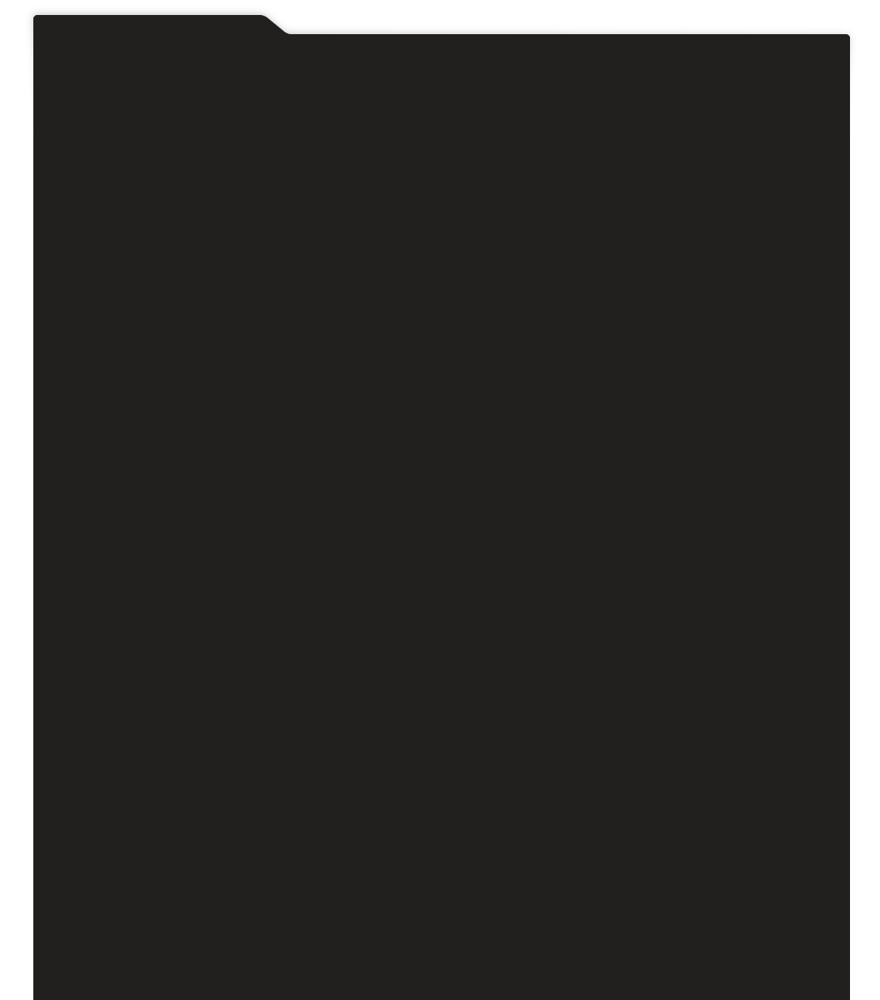
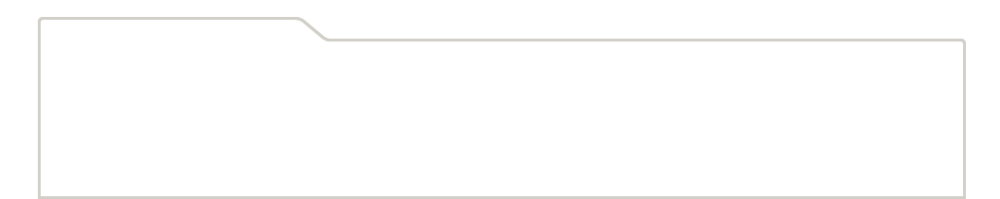
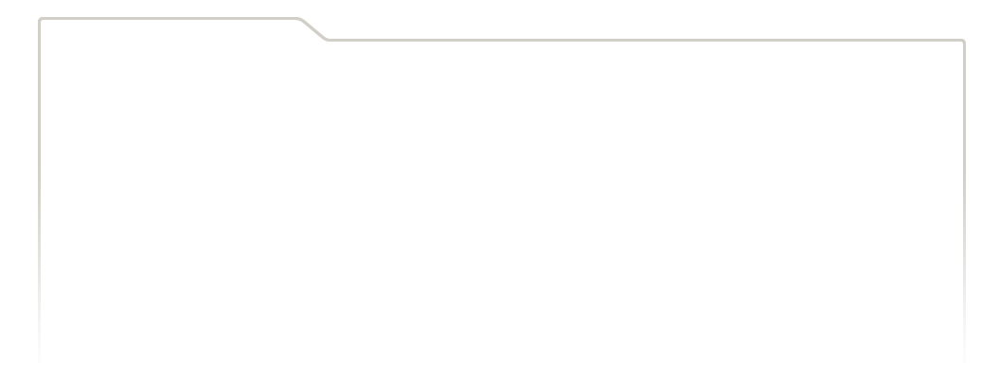
...
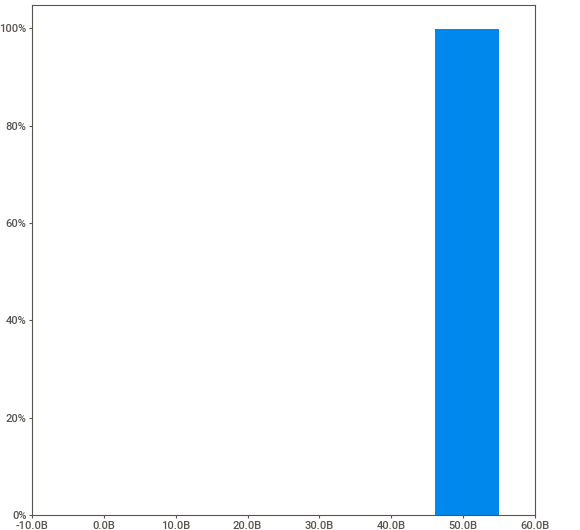
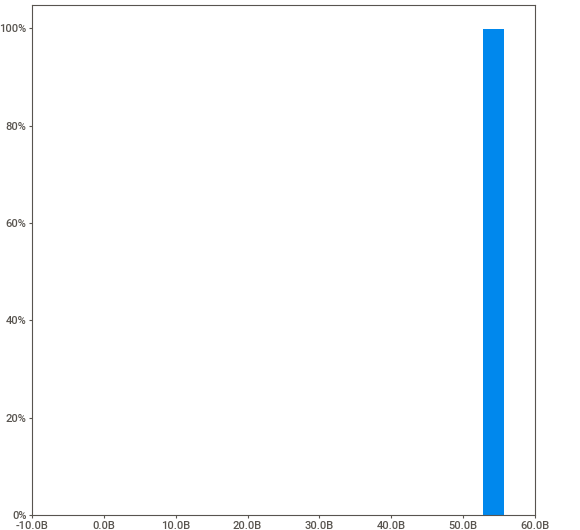
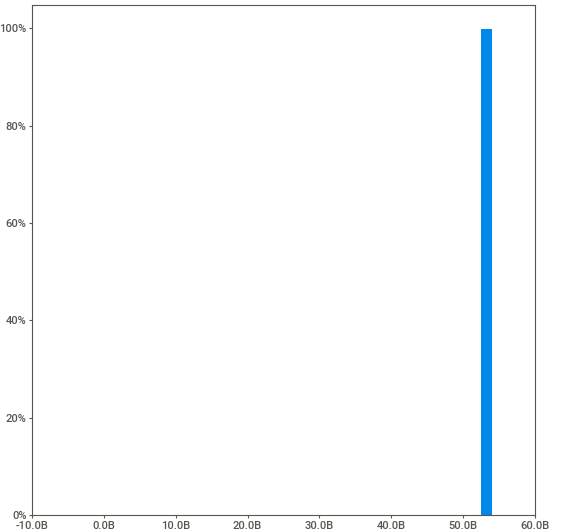
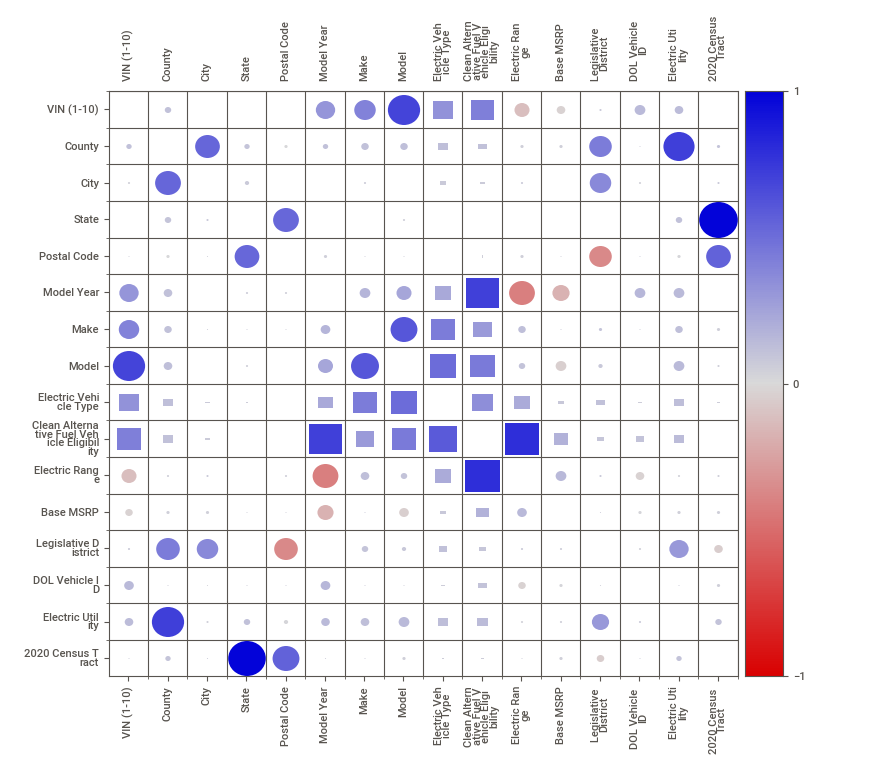
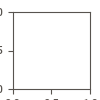

In [ ]:
report.show_notebook()
